<a href="https://colab.research.google.com/github/selyraa/2141720005-pcvk-2023/blob/main/week-07/JS07_Filter_Spasial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum 7 - Filter Spasial

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im
import os

## Konvolusi Tanpa Library

In [ ]:
def convolution2d(image, kernel, stride, padding):
  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = image.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  new_image = np.zeros((output_height, output_width)).astype(np.float32)

  for y in range(0, output_height):
    for x in range(0, output_width):
      new_image[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)

  return new_image

img = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)


## Sharpen

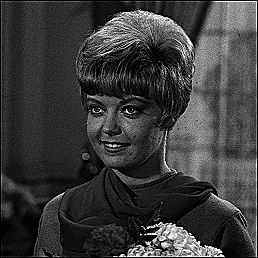

In [ ]:
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result = convolution2d(img_gray, kernel_sharpen, 1, 2)

# plt.title("Sharpen")
# plt.imshow(result)
# plt.show()
cv2_imshow(result)

## Emboss

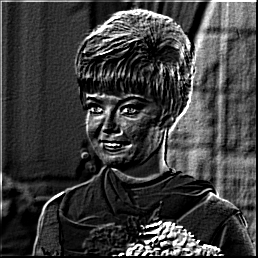

In [ ]:
kernel_emboss = np.array([[-2,-1,0],
                          [-1,1,1],
                          [0,1,2]])
result = convolution2d(img_gray, kernel_emboss, 1, 2)
cv2_imshow(result)

## Left Sobel Edge Detection

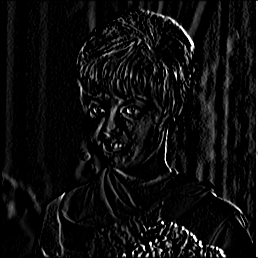

In [ ]:
kernel_sobel = np.array([[1,0,-1],
                          [2,0,-2],
                          [1,0,-1]])
result = convolution2d(img_gray, kernel_sobel,1, 2)
cv2_imshow(result)

## Canny Edge Detection

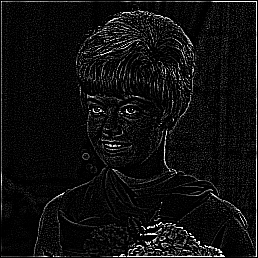

In [ ]:
kernel_canny = np.array([[-1,-1,-1],
                          [-1,8,-1],
                          [-1,-1,-1]])
result = convolution2d(img_gray, kernel_canny,1, 2)
cv2_imshow(result)

## Prewitt edge Detection

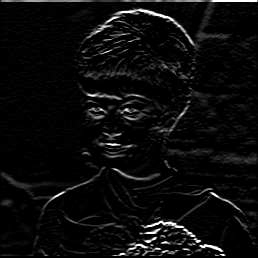

In [ ]:
kernel_prewitt = np.array([[-1,-1,-1],
                          [0,0,0],
                          [1,1,1]])
result = convolution2d(img_gray, kernel_prewitt,1, 2)
cv2_imshow(result)

## 5x5 Gaussian Blur

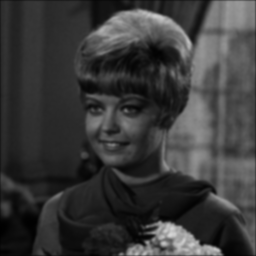

In [ ]:
kernel_gaussian_5x5 = np.array([
    [1,  4,  6,  4,  1],
    [4, 16, 24, 16,  4],
    [6, 24, 36, 24,  6],
    [4, 16, 24, 16,  4],
    [1,  4,  6,  4,  1]
]) / 256.0  # Normalisasi kernel

result = convolution2d(img_gray, kernel_gaussian_5x5,1, 2)
cv2_imshow(result)

## 21x21 Gaussian Blur

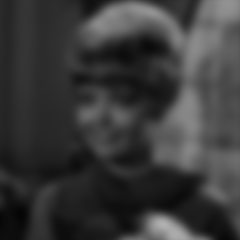

In [ ]:
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel, 1, 2))

# Tugas
Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui
implementasi teknik filterisasi dan detection setiap citra. Terapkan juga histogram equalization dan
operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP.

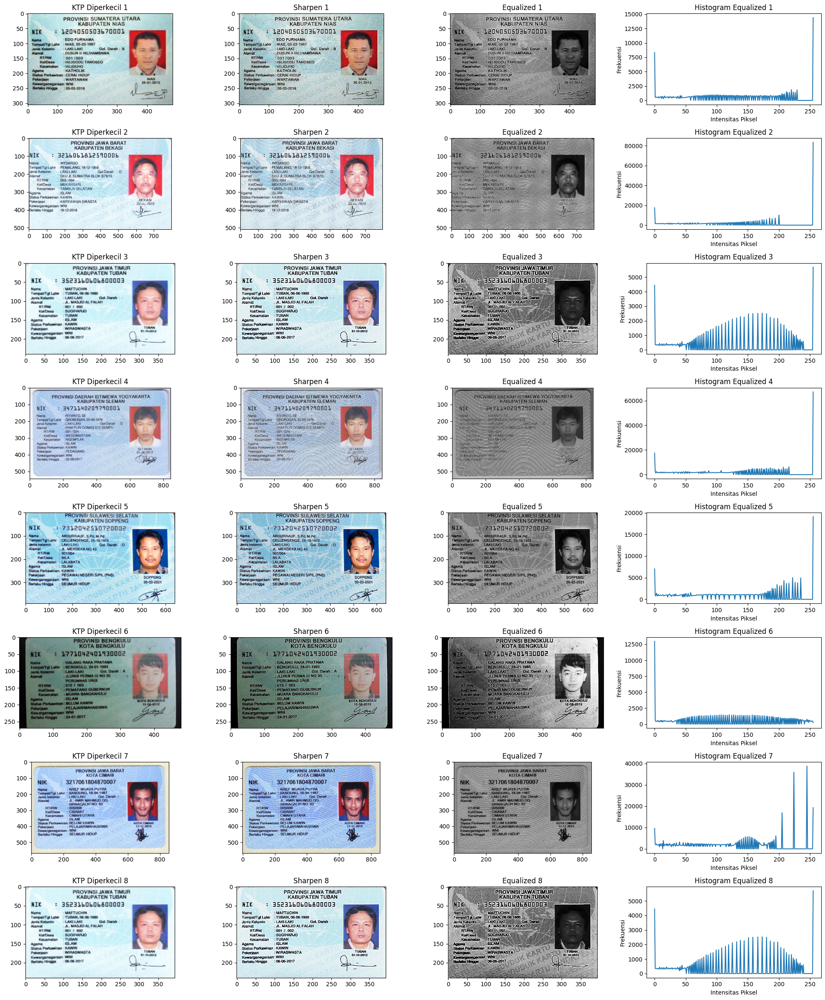

In [ ]:
folder_path = '/content/drive/MyDrive/PCVK/KTP/'

# Dapatkan daftar file citra dalam folder
ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Fungsi untuk penyesuaian kecerahan
def Brightness(image, value):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    v = cv2.add(v, value)
    v = np.clip(v, 0, 255)
    hsv = cv2.merge((h, s, v))
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

# Kernel untuk mengasah gambar
kernel_sharpen = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])


# Buat grid untuk menampilkan gambar
num_rows = len(ktp_files)
num_cols = 4
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 24))

# Iterasi pada gambar-gambar KTP
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    # Ubah ukuran gambar KTP
    ktp_image_resized = cv2.resize(ktp_image, (0, 0), fx=0.8, fy=0.8)

    # Terapkan penyesuaian Brightness
    brightness_adjusted = Brightness(ktp_image_resized, -10)

    # Terapkan Sharpen
    result = cv2.filter2D(brightness_adjusted, -1, kernel_sharpen)

    # Lakukan histogram equalization
    result_gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
    result_equalized = cv2.equalizeHist(result_gray)
    result_equalized_color = cv2.cvtColor(result_equalized, cv2.COLOR_GRAY2BGR)

    # Tampilkan gambar asli dengan label
    axs[i, 0].imshow(cv2.cvtColor(ktp_image_resized, cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title(f'KTP Diperkecil {i+1}')

    # Tampilkan gambar yang telah diolah dengan label
    axs[i, 1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB,))
    axs[i, 1].set_title(f'Sharpen {i+1}')

    # Tampilkan gambar hasil equalisasi dengan label
    axs[i, 2].imshow(cv2.cvtColor(result_equalized_color, cv2.COLOR_BGR2RGB))
    axs[i, 2].set_title(f'Equalized {i+1}')

    # Hitung histogram gambar hasil equalisasi
    hist_equalized = cv2.calcHist([result_equalized], [0], None, [256], [0, 256])

    # Tampilkan histogram pada kolom ke-4 dengan label
    axs[i, 3].plot(hist_equalized)
    axs[i, 3].set_title(f'Histogram Equalized {i+1}')
    axs[i, 3].set_xlabel('Intensitas Piksel')
    axs[i, 3].set_ylabel('Frekuensi')

# Tampilkan hasil keseluruhan
plt.tight_layout()
plt.show()

## Coba-coba

In [79]:
img = cv.imread('/content/drive/MyDrive/PCVK/KTP/ktp.png')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

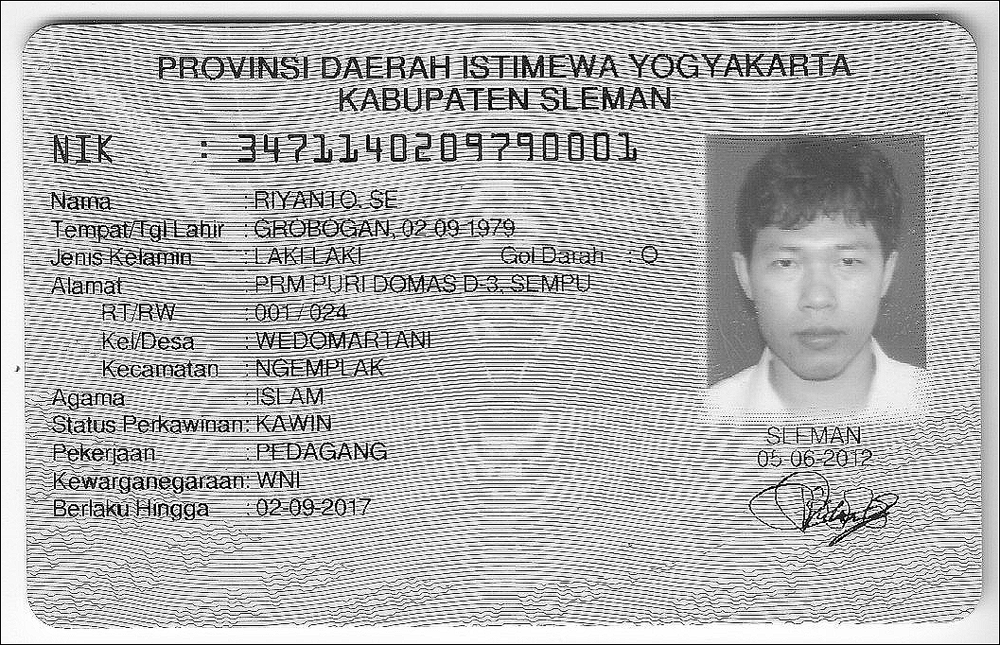

In [76]:
kernel_sharpen = np.array([[0, -1, 0],
                             [-1, 5, -1],
                             [0, -1, 0]])

result = convolution2d(img_gray, kernel_sharpen, 1, 2)

# plt.title("Sharpen")
# plt.imshow(result)
# plt.show()
cv2_imshow(result)

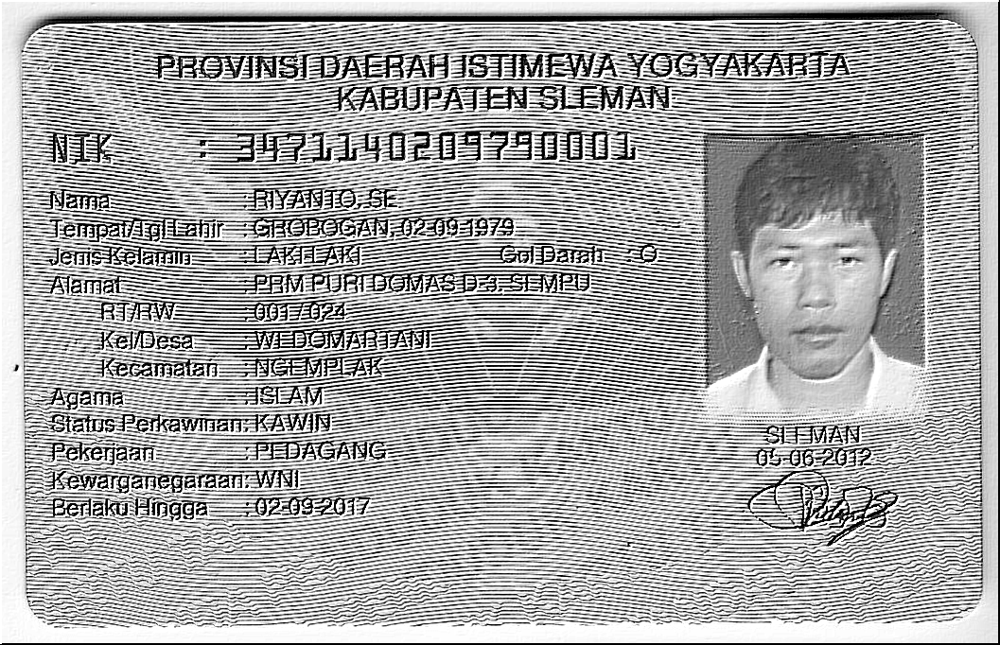

In [ ]:
kernel_emboss = np.array([[-2,-1,0],
                          [-1,1,1],
                          [0,1,2]])
result = convolution2d(img_gray, kernel_emboss, 1, 2)
cv2_imshow(result)

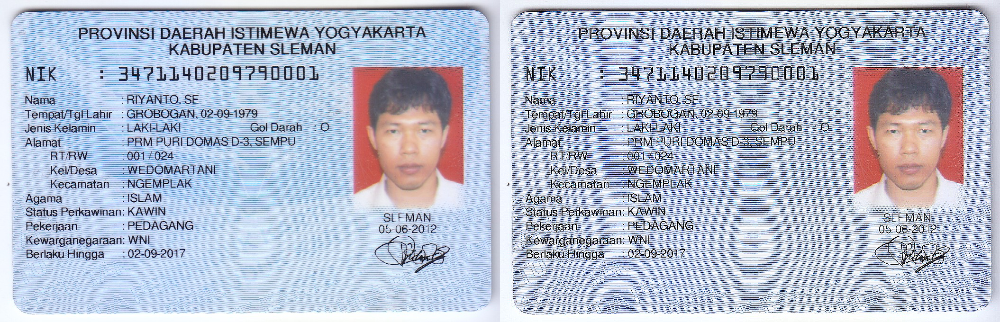

In [ ]:
import cv2
import numpy as np

result = cv2.filter2D(img, -1, kernel_sharpen)

result = cv2.resize(result, (img_gray.shape[1], img_gray.shape[0]))

final_frame = cv2.hconcat((img, result))

cv2_imshow(final_frame)


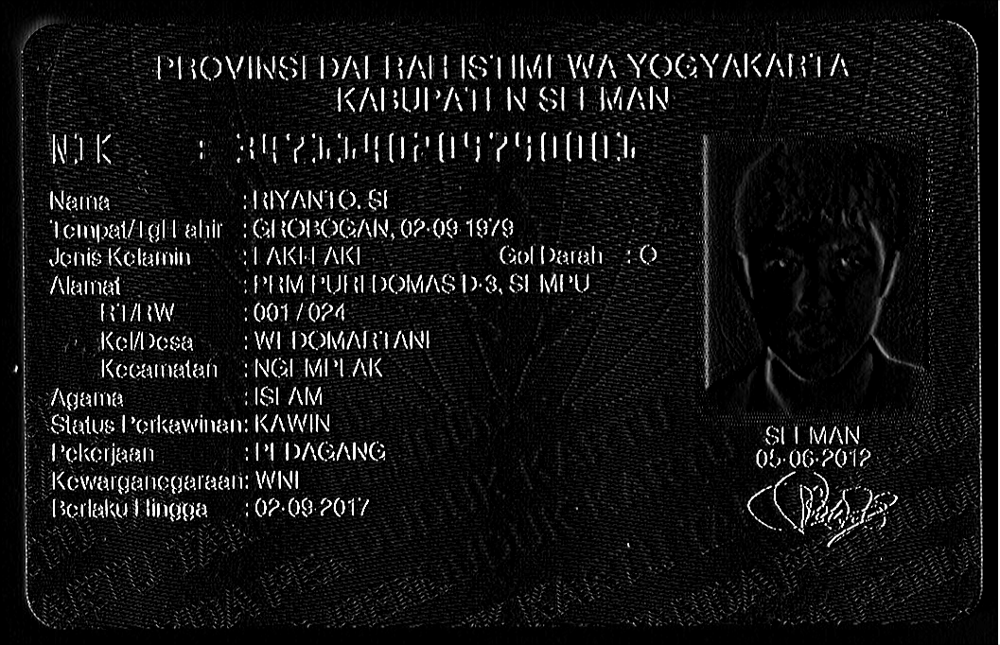

In [ ]:
kernel_prewitt = np.array([[1,0,-1],
                          [2,0,-2],
                          [1,0,-1]])
result = convolution2d(img_gray, kernel_prewitt,1, 2)
cv2_imshow(result)

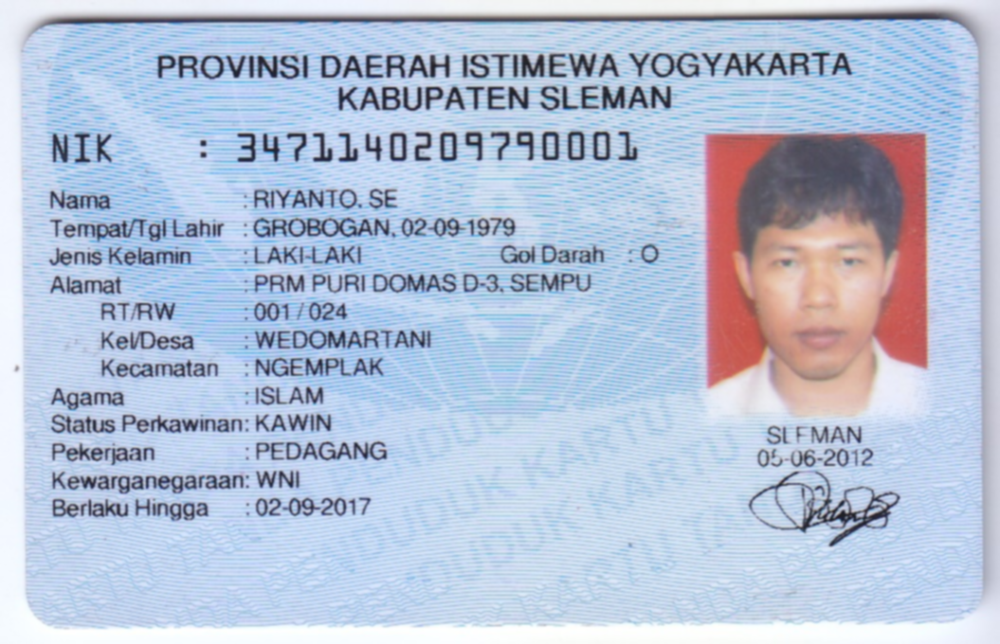

In [ ]:
import cv2

img = cv.imread('/content/drive/MyDrive/PCVK/KTP/ktp.png')
filtered_image = cv2.GaussianBlur(img, (5, 5), 0)  # Contoh Gaussian Blur
cv2_imshow(filtered_image)

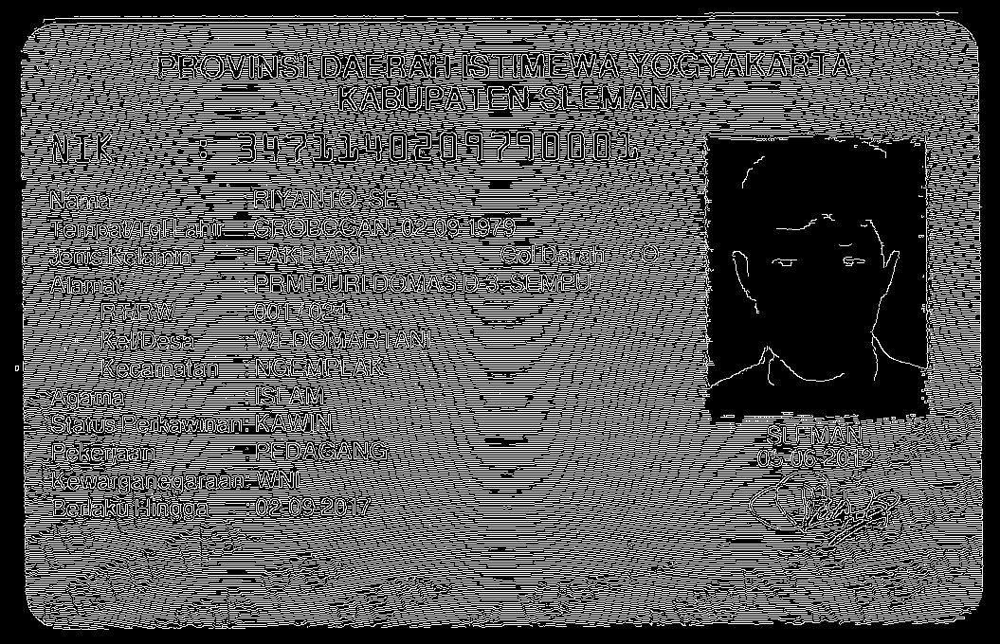

In [ ]:
# Tentukan nilai threshold1 dan threshold2
threshold1 = 100
threshold2 = 200

# Terapkan operasi Canny
edges = cv2.Canny(img, threshold1, threshold2)

cv2_imshow(edges)

In [ ]:
gray_image = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2GRAY)
equalized_image = cv2.equalizeHist(gray_image)